In [1]:
import scanpy
import anndata
import matplotlib
from matplotlib import pyplot
import hdf5plugin
import numpy
import scvelo
import seaborn
import pandas
import warnings
import cellrank

In [2]:
# Read input file
working_directory = "RNA Sequencing Data/"

# adata = scanpy.read_h5ad(working_directory + "/velocity_sdevelo.h5ad")

# Or read saved anndata objects
base_name = "cellrank_1.3"
adata = scanpy.read_h5ad(
    working_directory+f"/{base_name} cells.h5ad"
)
dead_end_adata = scanpy.read_h5ad(
    working_directory+f"/{base_name} dead end genes.h5ad"
)
mESC_adata = scanpy.read_h5ad(
    working_directory+f"/{base_name} mESC genes.h5ad"
)
driver_df = pandas.read_csv(
    working_directory+f"{base_name} driver genes.csv",
)

print(adata)

AnnData object with n_obs × n_vars = 12791 × 2000
    obs: 'barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts', 'total_counts', 'total_counts_mt', 'pct_counts_mt', 'initial_size_unspliced', 'initial_size_spliced', 'initial_size', 'n_counts', 'latent_time', 'sde_velocity_self_transition', 'manual_root', 'manual_end', 'sde_velocity_pseudotime', 'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs', 'init_states_fwd', 'init_states_fwd_probs', 'clusters_gradients', 'fate_probabilities_Day 12 Control', 'fate_probabilities_mESC'
    var: 'ensemble_ids', 'gene_symbol', 'mt', 'n_cells_by_counts', 'mean_counts', 'pct_dropout_by_counts', 'total_counts', 'gene_count_corr', 'means', 'dispersions', 'dispersions_norm', 'highly_variable', 'fit_alpha', 'fit_beta', 'fit_gamma', 'fit_t_', 'fit_sigma_1', 'fit_sigma_2'
    uns: 'T_fwd_params', 'clusters_gradients_colors', 'coarse_fwd', 'eigendecomposition_fwd', 'init_states_fwd_colors', 'lineage_Day 12 Control_trend', 'lineage_mESC_t

In [3]:
# Suppress warnings

warnings.simplefilter("ignore", category=UserWarning)

In [6]:
# Create velocity kernel

velocity_kernel = cellrank.kernels.VelocityKernel(adata, vkey="sde_velocity")
velocity_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

  0%|          | 0/12791 [00:00<?, ?cell/s]

VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344]

In [7]:
# Create kernel based on latent time

latent_time_kernel = cellrank.kernels.PseudotimeKernel(adata, time_key = "latent_time")
latent_time_kernel.compute_transition_matrix()

  0%|          | 0/12791 [00:00<?, ?cell/s]

PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3]

In [8]:
# Kernel based on gene expression similarity

# Neigborhood calculation is based on 30 pcs, 30 neighbors
print(adata.uns["neighbors"])

connectivity_kernel = cellrank.kernels.ConnectivityKernel(adata)
connectivity_kernel.compute_transition_matrix()

{'connectivities_key': 'connectivities', 'distances_key': 'distances', 'params': {'method': 'umap', 'metric': 'euclidean', 'n_neighbors': 30, 'n_pcs': 30, 'random_state': 0}}


ConnectivityKernel[n=12791, dnorm=True, key='connectivities']

In [9]:
# Combine all three kernels

combined_kernel = 0.4*velocity_kernel + 0.4*latent_time_kernel + 0.2*connectivity_kernel
combined_kernel.compute_transition_matrix()

(0.4 * VelocityKernel[n=12791, model='deterministic', similarity='correlation', softmax_scale=6.344] + 0.4 * PseudotimeKernel[n=12791, dnorm=False, scheme='hard', frac_to_keep=0.3] + 0.2 * ConnectivityKernel[n=12791, dnorm=True, key='connectivities'])

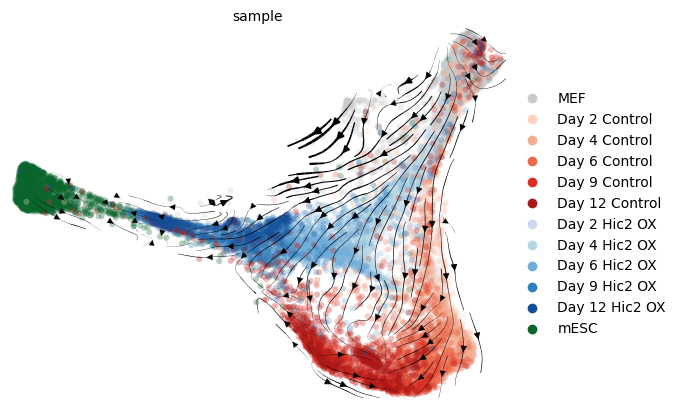

In [8]:
# Plot kernel vector field

combined_kernel.plot_projection(basis="fdl", color="sample", legend_loc="right margin")

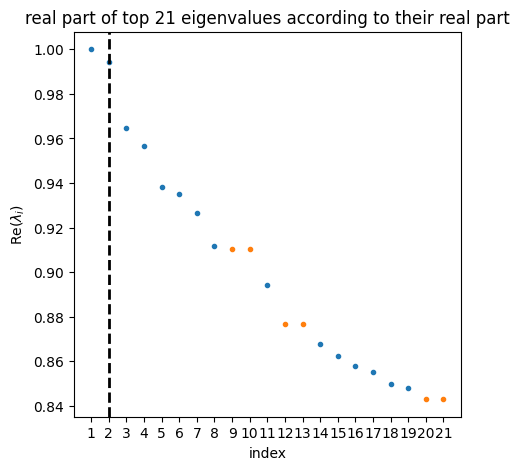

In [10]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.compute_schur()
estimator.plot_spectrum(real_only=True)

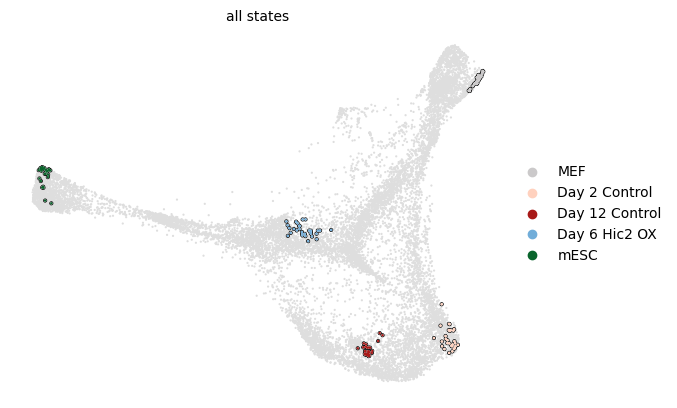

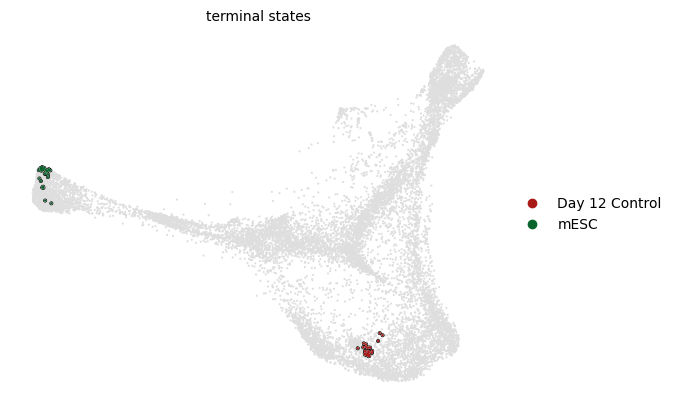

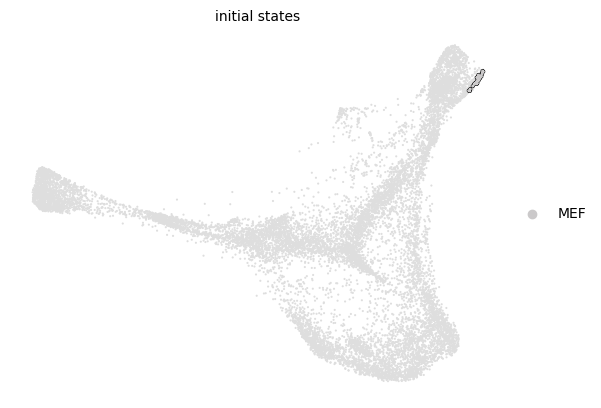

In [11]:
estimator = cellrank.estimators.GPCCA(combined_kernel)
estimator.fit(n_states=[4, 10], cluster_key="sample")

estimator.plot_macrostates(which="all", legend_loc="right", s=10, basis="fdl")
macrostates = estimator.macrostates_memberships.names

# Predict terminal states

estimator.predict_terminal_states(method="eigengap")
estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=True, basis="fdl")
terminal_states = estimator.terminal_states_memberships.names

# Predict initial states

estimator.predict_initial_states()
estimator.plot_macrostates(which="initial", legend_loc="right", basis="fdl", discrete=True)
initial_states = estimator.initial_states_memberships.names

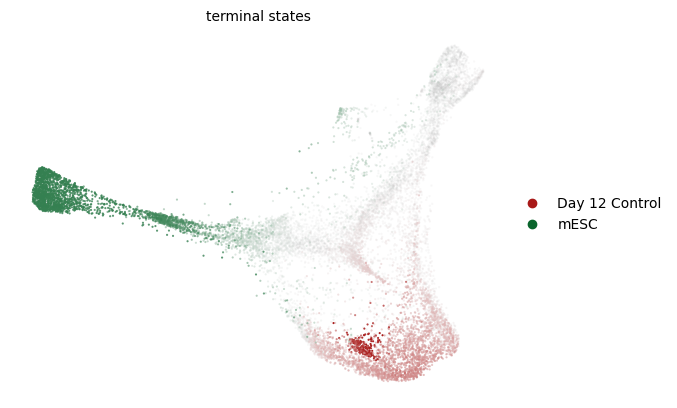

In [11]:
# Plot probability of cells belonging to the terminal states

estimator.plot_macrostates(which="terminal", legend_loc="right", discrete=False, basis="fdl")

In [12]:
# Plot stability values. These are used to find terminal states with method="stability" and show that Day 4 control and Day 9 Hic2 OX are metastable

stability_values = estimator.coarse_T.values.diagonal()

stability_df = pandas.DataFrame({
    "Macrostate": macrostates,
    "Stability": stability_values
}).sort_values("Stability", ascending=False)

print(stability_df)

       Macrostate  Stability
4            mESC   0.998798
2  Day 12 Control   0.981956
1   Day 2 Control   0.969982
3   Day 6 Hic2 OX   0.966000
0             MEF   0.937341


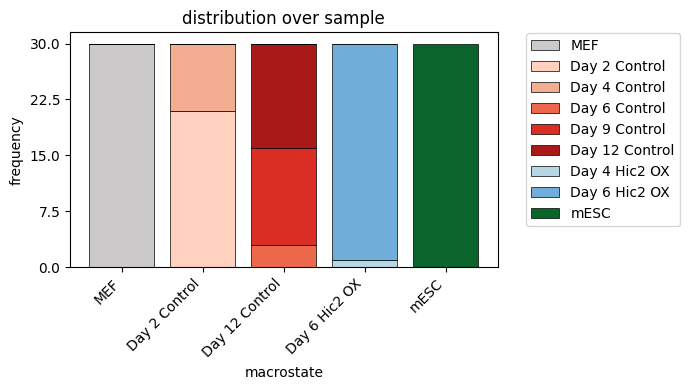

In [13]:
estimator.plot_macrostate_composition(key="sample", figsize=(7, 4))

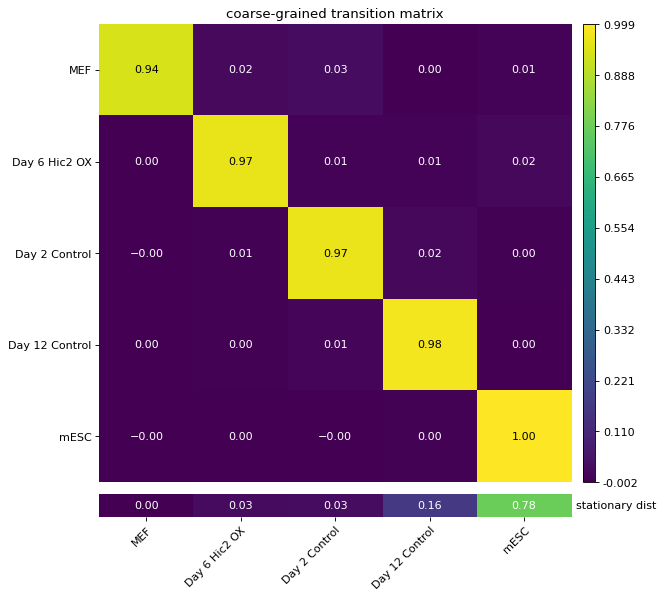

In [14]:
estimator.plot_coarse_T()

  0%|          | 0/2 [00:00<?, ?/s]

  0%|          | 0/2 [00:00<?, ?/s]

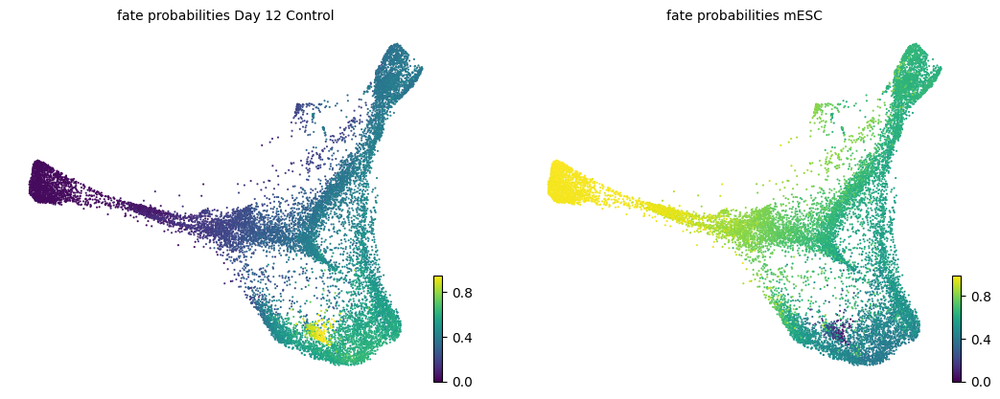

In [14]:
# Estimate fate probabilities

estimator.compute_fate_probabilities()

# Add fate probabilities to adata
for terminal_state in terminal_states:
    adata.obs[f"fate_probabilities_{terminal_state}"] = estimator.fate_probabilities[terminal_state].X.flatten()
estimator.compute_fate_probabilities()
estimator.plot_fate_probabilities(same_plot=False, basis="fdl")

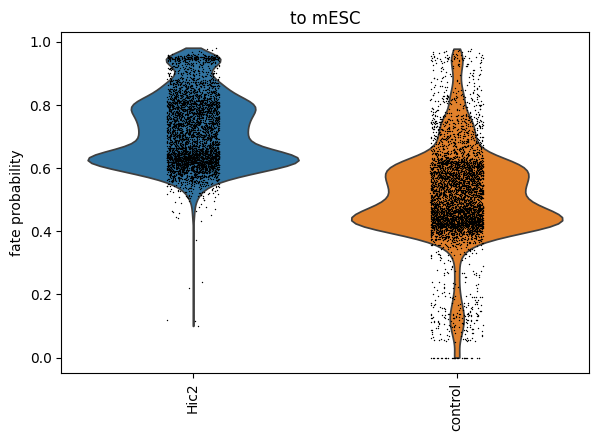

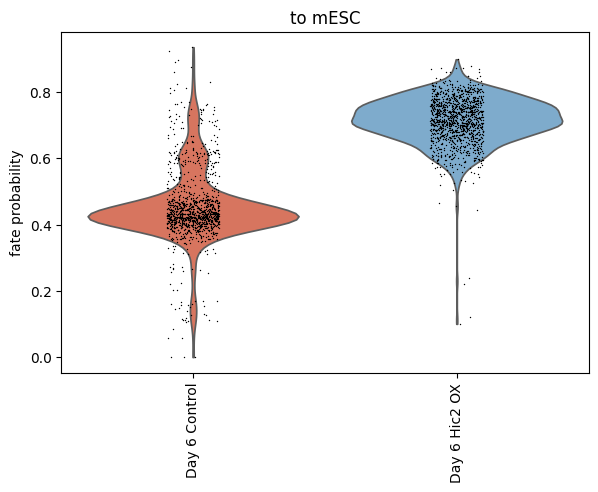

In [24]:
# Aggregate fate probabilities

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="group",
    clusters=["control", "Hic2"],
)

cellrank.pl.aggregate_fate_probabilities(
    adata,
    mode="violin",
    lineages=["mESC"],
    cluster_key="sample",
    clusters=["Day 6 Control", "Day 6 Hic2 OX"],
)

In [15]:
# Find driver genes for all terminal states

reprogramming_groups = ["Hic2", "control"]

driver_df = estimator.compute_lineage_drivers(
    cluster_key="group", clusters=reprogramming_groups
)
corr_columns = [state+"_corr" for state in terminal_states]


In [18]:
# Drivers for mESCs
driver_df.sort_values("mESC_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Rbpms2,-0.602234,0.602234
Mdk,-0.588932,0.588928
Fbxo15,-0.588025,0.588027
Folr1,-0.579032,0.579032
Utf1,-0.577006,0.577006
Apoc1,-0.566884,0.566884
Dnmt3l,-0.561192,0.561194
Gdf3,-0.558956,0.558955
Klhl13,-0.558730,0.558735


In [19]:
# Drivers for Day 12 control
driver_df.sort_values("Day 12 Control_corr", ascending=False).head(20)[corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Cd24a,0.666145,-0.666162
Lmo1,0.591416,-0.591415
Crip2,0.579631,-0.579640
Ctsz,0.574879,-0.574909
Lgals7,0.573642,-0.573639
Rtn4r,0.570925,-0.570925
Tmem238,0.536201,-0.536205
S100a16,0.525240,-0.525245
Pcolce2,0.525131,-0.525128


In [20]:
# How specific genes correlate with terminal states
genes_of_interest = ["Krtdap", "Krt8", "Krt14", "Nanog", "Tet1", "Cdh1", "Atf3"]
driver_df.loc[genes_of_interest, corr_columns]

,Day 12 Control_corr,mESC_corr
gene_names,,
Krtdap,0.108548,-0.108542
Krt8,0.440565,-0.440560
Krt14,0.343191,-0.343187
Nanog,-0.309888,0.309886
Tet1,-0.484526,0.484528
Cdh1,0.308698,-0.308698
Atf3,0.337880,-0.337882


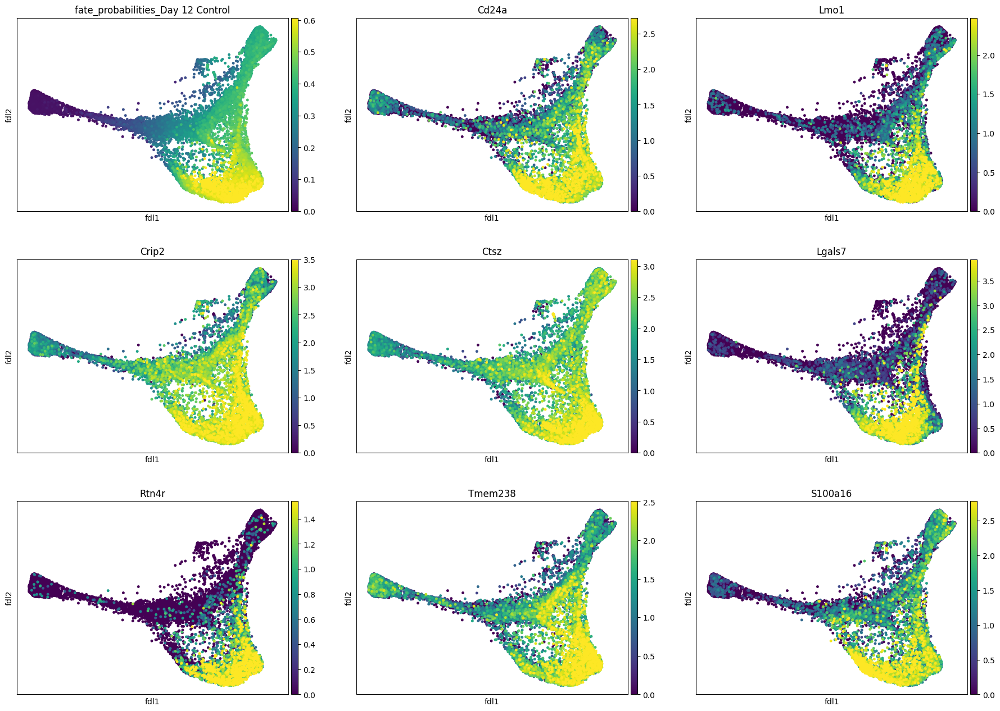

In [21]:
# Visualize driver genes for day 12 control

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + list(driver_df.sort_values(f"{terminal_state}_corr", ascending=False).index[:8]),
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

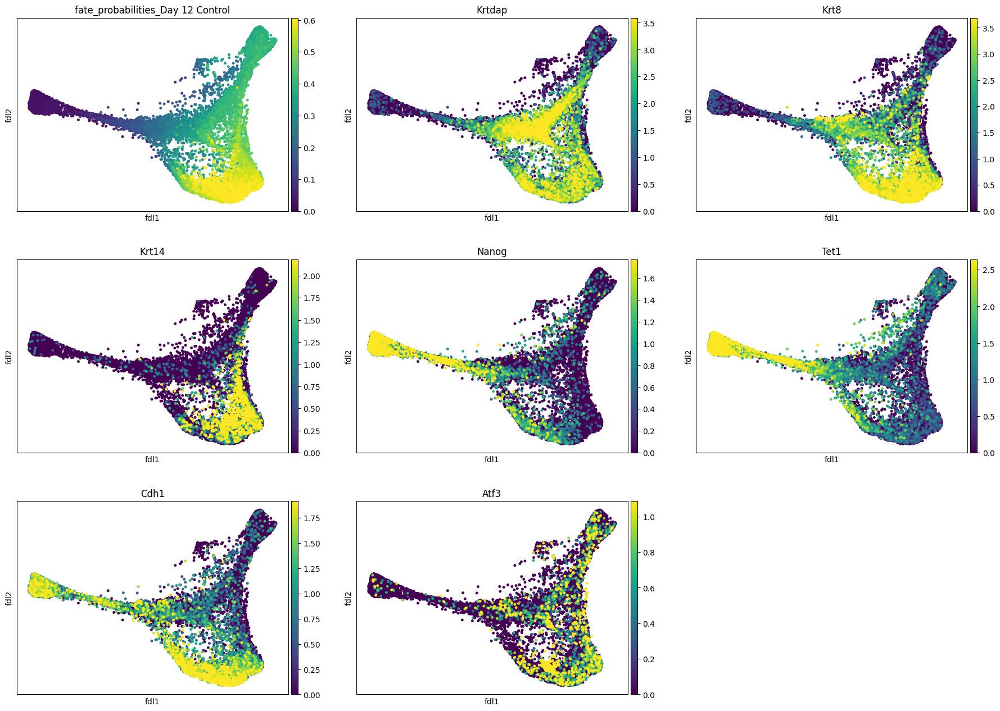

In [26]:
# Visualize genes of interest

terminal_state = "Day 12 Control"
scanpy.pl.embedding(
    adata,
    basis="fdl",
    color=[f"fate_probabilities_{terminal_state}"] + genes_of_interest,
    color_map="viridis",
    s=50,
    ncols=3,
    vmax="p96",
)

In [22]:
# Gene expression over time

# Create model
model = cellrank.models.GAMR(adata, n_knots=6, smoothing_penalty=10.0) # GAMR can be used instead to have the R model

To use GAM, pygam is needed

To use GAMR, r-base, rpy2 and mgcv are needed

In [23]:
print(adata.obs.columns)

Index(['barcode', 'batch', 'sample', 'group', 'day', 'n_genes_by_counts',
       'total_counts', 'total_counts_mt', 'pct_counts_mt',
       'initial_size_unspliced', 'initial_size_spliced', 'initial_size',
       'n_counts', 'latent_time', 'sde_velocity_self_transition',
       'manual_root', 'manual_end', 'sde_velocity_pseudotime',
       'macrostates_fwd', 'term_states_fwd', 'term_states_fwd_probs',
       'init_states_fwd', 'init_states_fwd_probs', 'clusters_gradients',
       'fate_probabilities_Day 12 Control', 'fate_probabilities_mESC'],
      dtype='object')


  0%|          | 0/7 [00:00<?, ?gene/s]

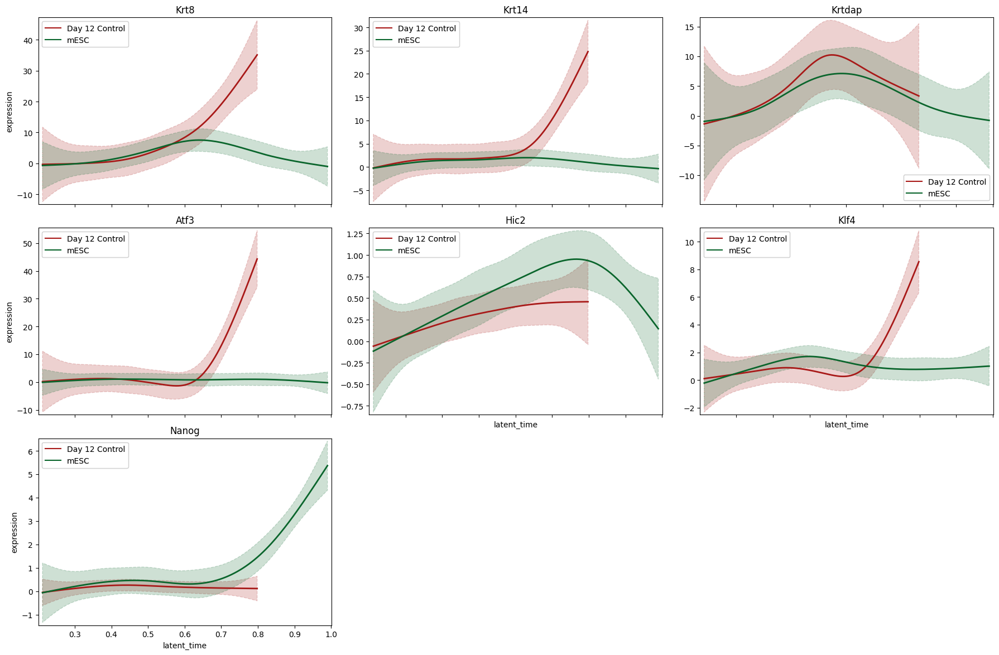

In [25]:
trend_genes = ["Krt8", "Krt14", "Krtdap", "Atf3", "Hic2", "Klf4", "Nanog"]
reprogramming_group_indices = (adata.obs["group"] == "control") | (adata.obs["group"] == "Hic2")
cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=trend_genes,
    data_key="spliced",
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/20 [00:00<?, ?gene/s]

[0]PETSC ERROR: ------------------------------------------------------------------------
[0]PETSC ERROR: Caught signal number 13 Broken Pipe: Likely while reading or writing to a socket
[0]PETSC ERROR: Try option -start_in_debugger or -on_error_attach_debugger
[0]PETSC ERROR: or see https://petsc.org/release/faq/#valgrind and https://petsc.org/release/faq/
[0]PETSC ERROR: configure using --with-debugging=yes, recompile, link, and run 
[0]PETSC ERROR: to get more information on the crash.
Abort(59) on node 0 (rank 0 in comm 0): application called MPI_Abort(MPI_COMM_WORLD, 59) - process 0


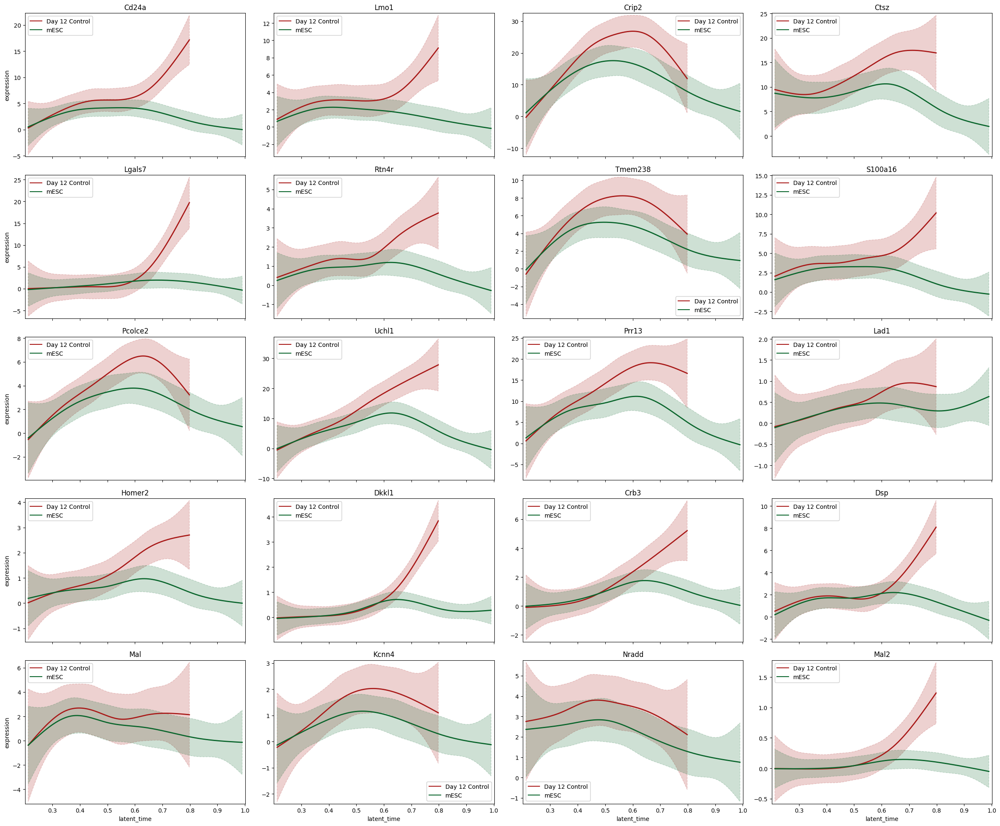

In [27]:
# The 20 strongest drivers of dead end
dead_end = "Day 12 Control"
cellrank.pl.gene_trends(
    adata[reprogramming_group_indices],
    model=model,
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(20).index,
    data_key="spliced",
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

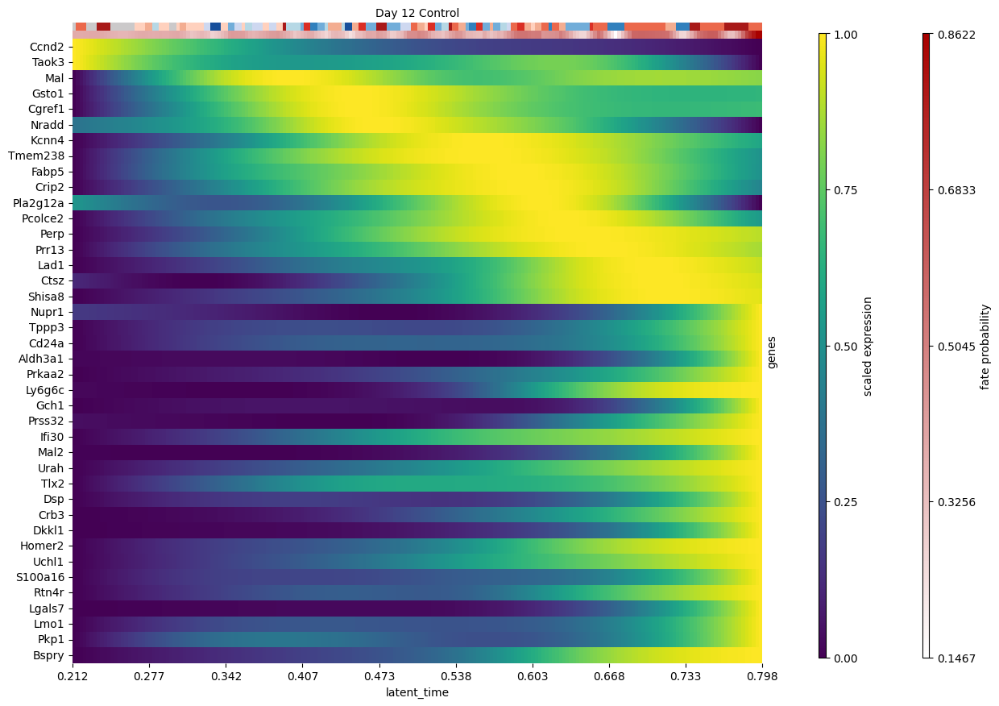

In [29]:
# Heatmap for dead-end related genes

cellrank.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=dead_end,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


  0%|          | 0/40 [00:00<?, ?gene/s]

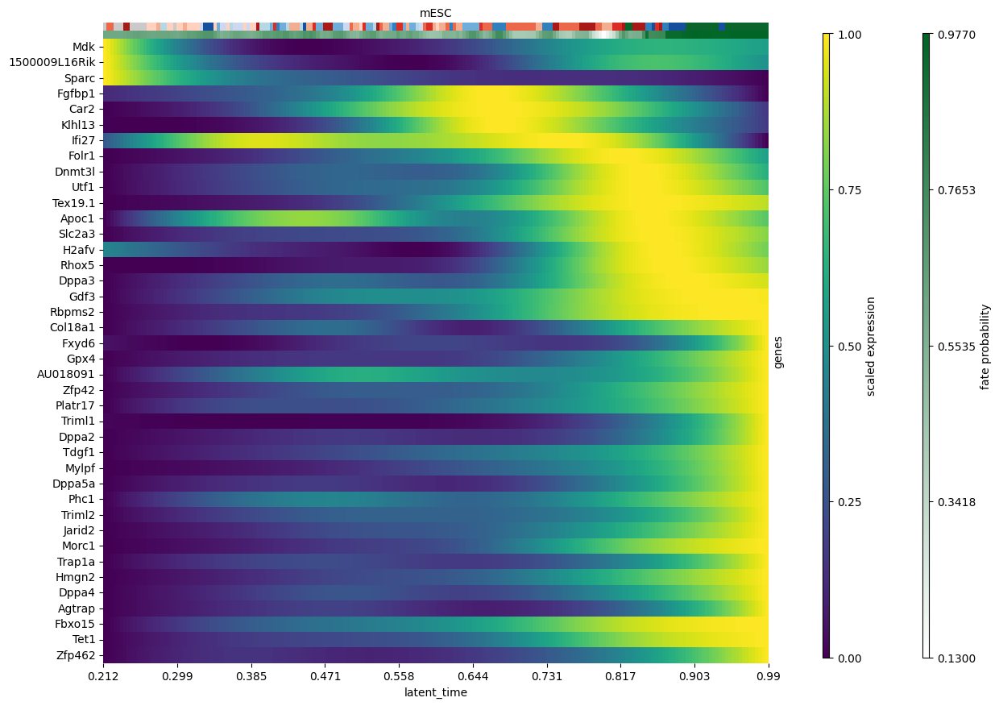

In [30]:
# Heatmap for completed reprogramming

terminal_state = "mESC"

cellrank.pl.heatmap(
    adata,
    model=model,  # use the model from before
    lineages=terminal_state,
    cluster_key="sample",
    show_fate_probabilities=True,
    data_key="spliced",
    genes=driver_df.sort_values(f"{terminal_state}_corr", ascending=False).head(40).index,
    time_key="latent_time",
    figsize=(12, 10),
    show_all_genes=True,
    weight_threshold=(1e-3, 1e-3),
)


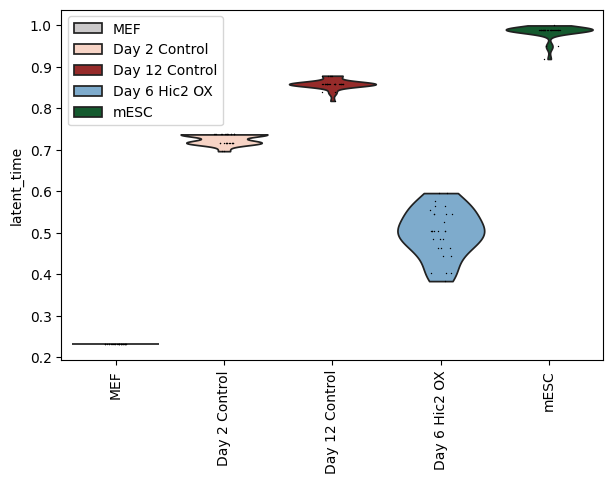

In [31]:
# Show macrostates in latent time

scanpy.pl.violin(adata, keys=["latent_time"], groupby="macrostates_fwd", rotation=90)

Clustering requires the leidenalg package

  0%|          | 0/2000 [00:00<?, ?gene/s]

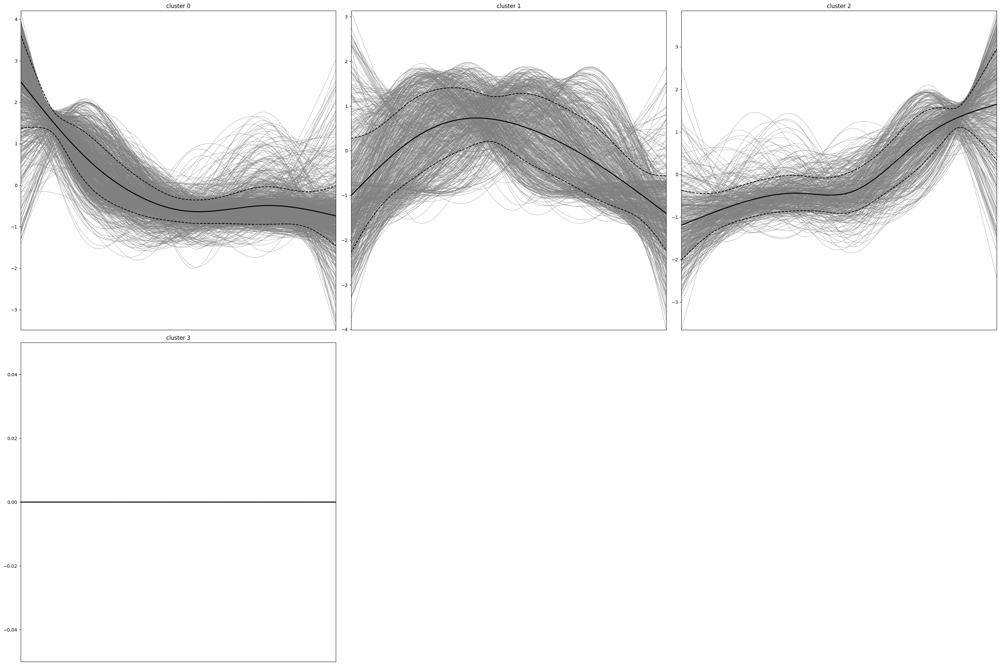

In [33]:
# Cluster for mESC

cellrank.pl.cluster_trends(
    adata,
    lineage="mESC",
    model=model,  # use the model from before
    data_key="spliced",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="latent_time",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=16,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)


  0%|          | 0/2000 [00:00<?, ?gene/s]

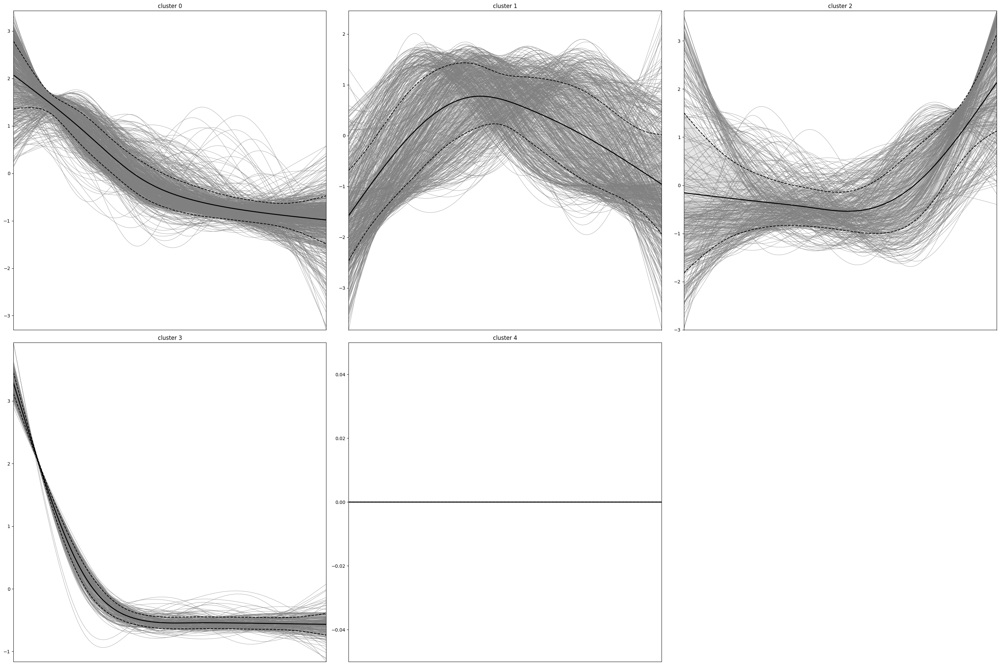

In [32]:
# Cluster for dead end

cellrank.pl.cluster_trends(
    adata,
    lineage=dead_end,
    model=model,  # use the model from before
    data_key="spliced",
    genes=adata[:, adata.var["highly_variable"]].var_names,
    time_key="latent_time",
    weight_threshold=(1e-3, 1e-3),
    n_jobs=16,
    random_state=0,
    clustering_kwargs={"resolution": 0.2, "random_state": 0},
    neighbors_kwargs={"random_state": 0},
)


In [34]:
# Copy gene clusters to separate anndata objects

dead_end_adata = adata.uns[f"lineage_{dead_end}_trend"].copy()
cols = ["means", "dispersions"]
dead_end_adata.obs = dead_end_adata.obs.merge(
    right=adata.var[cols], how="left", left_index=True, right_index=True
)
mESC_adata = adata.uns["lineage_mESC_trend"].copy()
mESC_adata.obs = mESC_adata.obs.merge(
    right=adata.var[cols], how="left", left_index=True, right_index=True
)

print(dead_end_adata)

AnnData object with n_obs × n_vars = 2000 × 200
    obs: 'clusters', 'means', 'dispersions'
    var: 'x_test'
    uns: 'pca', 'neighbors', 'clusters'
    obsm: 'X_pca'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'


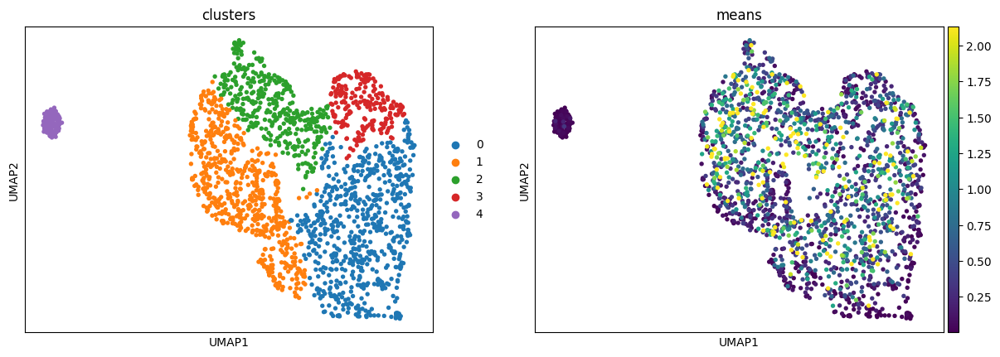

In [35]:
# Visualize gene clusters

scanpy.tl.umap(dead_end_adata, random_state=0)

scanpy.pl.embedding(dead_end_adata, basis="umap", color=["clusters", "means"], vmax="p95")


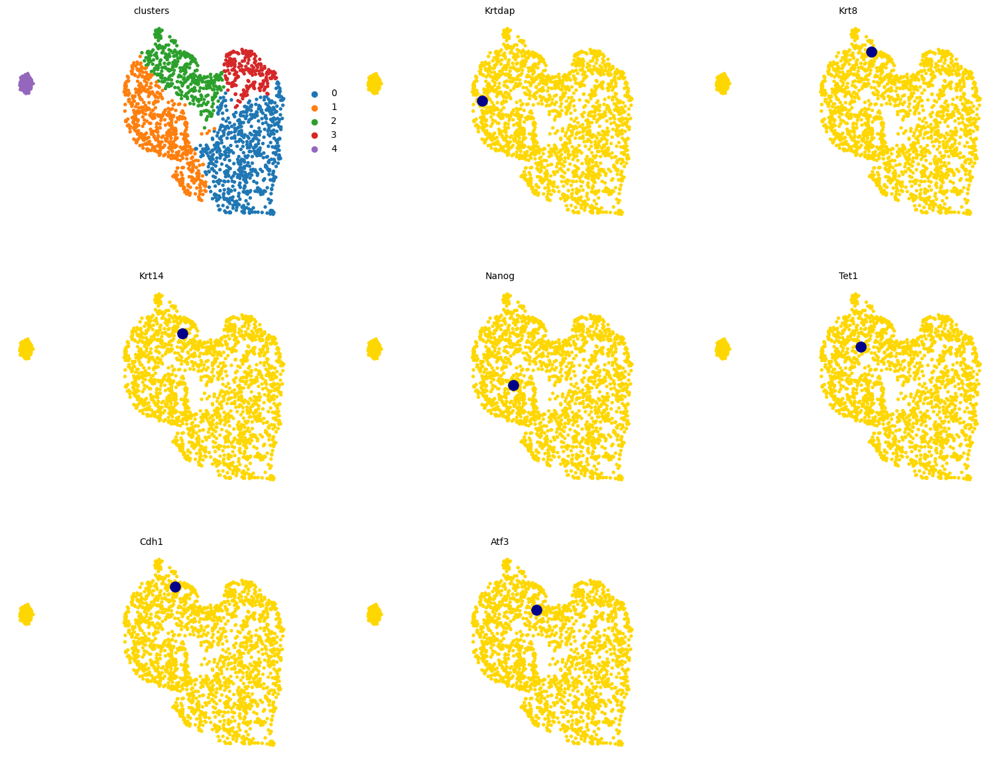

In [36]:
# Visualize where in the clusters genes of interest are found

# retrieve their indices for plotting
indices = [numpy.where(numpy.in1d(dead_end_adata.obs_names, gene))[0][0] for gene in genes_of_interest]
title = ["clusters"] + genes_of_interest

scvelo.pl.scatter(
    dead_end_adata, c=["clusters"] + indices, title=title, ncols=3, legend_loc="right"
)

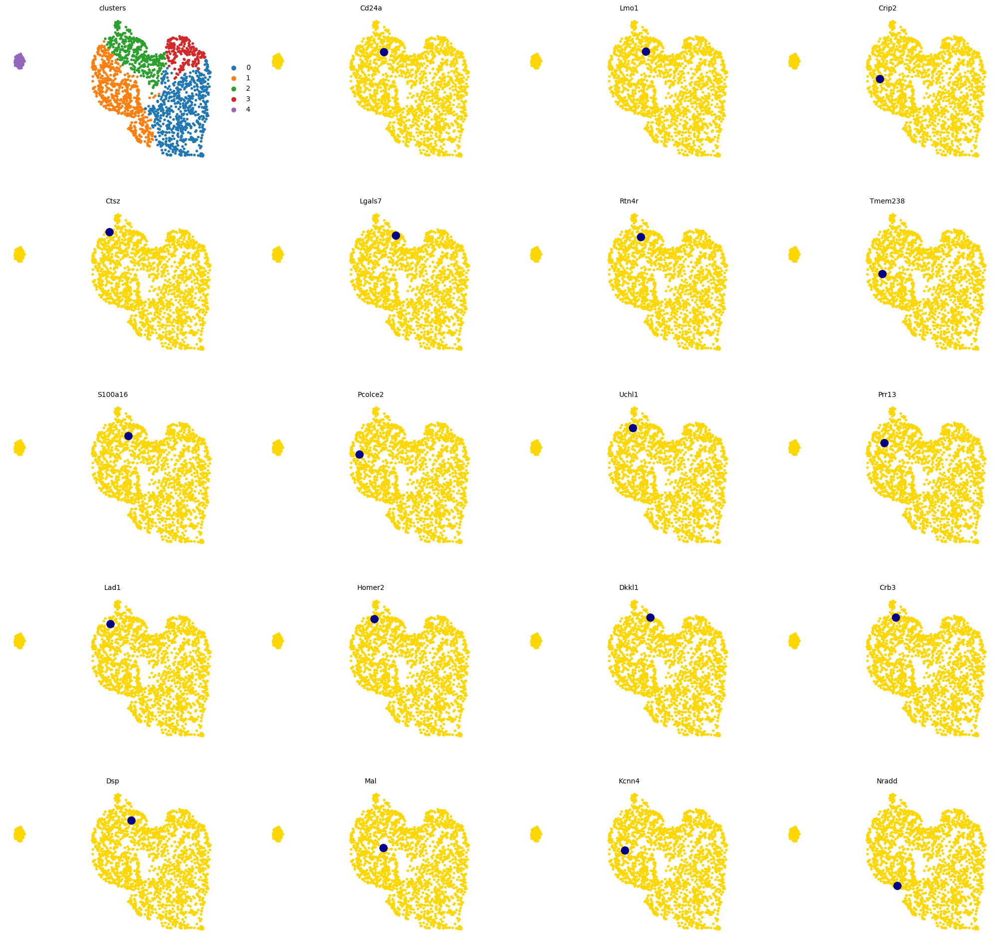

In [37]:
# Visualize where driver genes are found

# retrieve their indices for plotting
driver_genes = list(driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(19).index)
indices = [numpy.where(numpy.in1d(dead_end_adata.obs_names, gene))[0][0] for gene in driver_genes]
title = ["clusters"] + driver_genes

scvelo.pl.scatter(
    dead_end_adata, c=["clusters"] + indices, title=title, ncols=4, legend_loc="right"
)

Most genes have late peaks, but Crip2, Nradd and some other genes have intermediate peaks. Nradd promotes apoptosis. Genes with similar expression dynamics can be found.

  0%|          | 0/33 [00:00<?, ?gene/s]

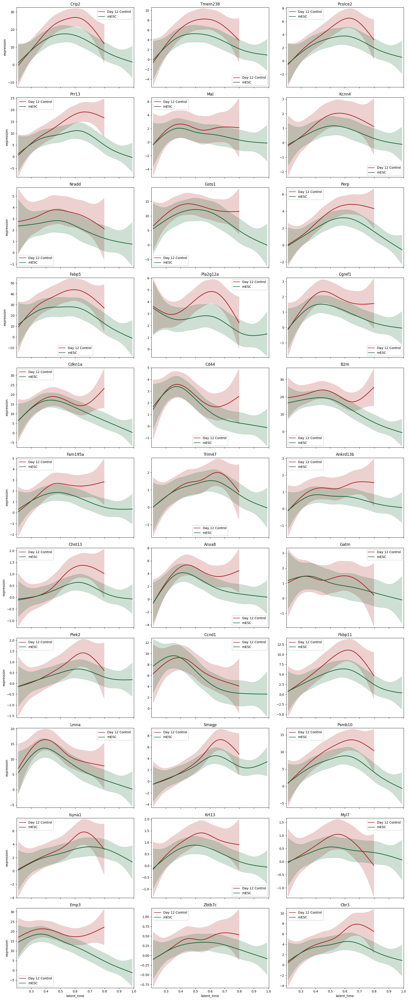

In [38]:
# Find driver genes peaking in the middle

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "1"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/3 [00:00<?, ?gene/s]

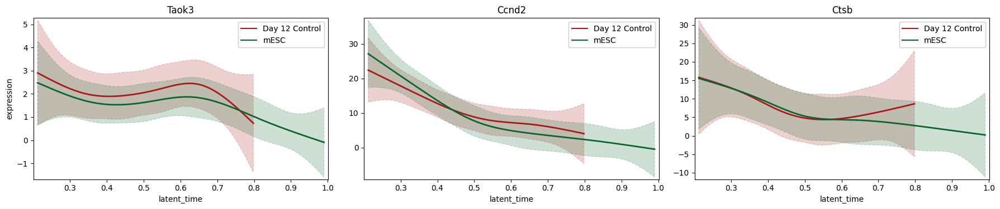

In [41]:
# Find driver genes with slowly decreasing expression

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "0"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/2 [00:00<?, ?gene/s]

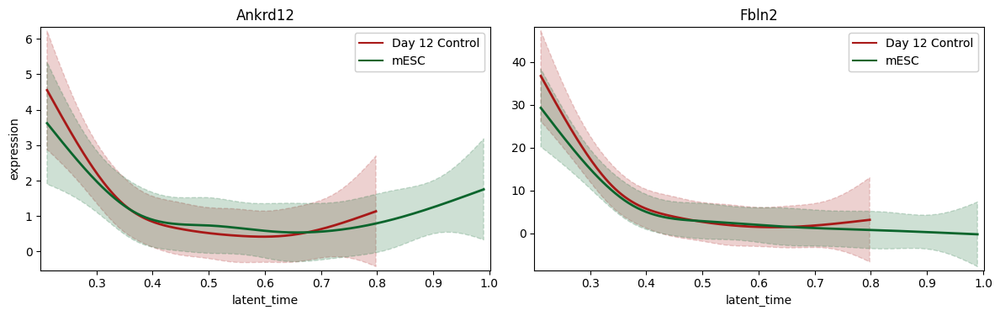

In [48]:
# Find driver genes with early dips in expression

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "3"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(200).index: # None of the top 100 drivers have early dips, and only 2 in the top 200
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=3,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

  0%|          | 0/64 [00:00<?, ?gene/s]

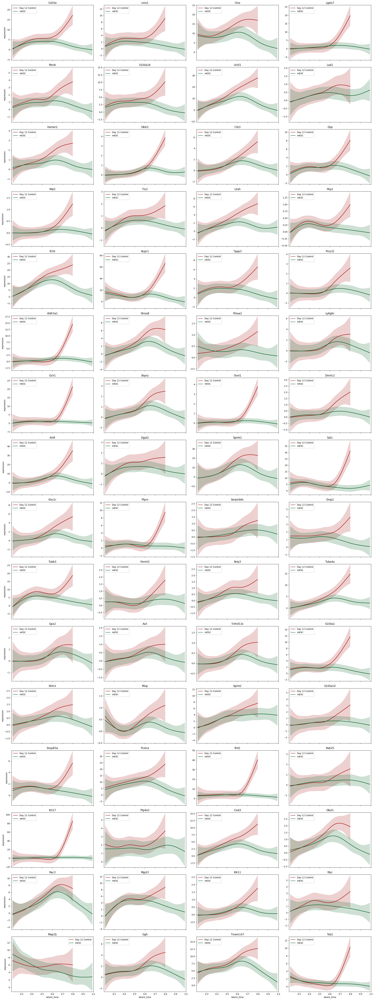

In [ ]:
# Find driver genes increasing quickly at the end of the trajectory. Most drivers have this type of expression

mid_peak_genes = dead_end_adata[dead_end_adata.obs["clusters"] == "2"]
mid_peak_drivers = []

for driver_gene in driver_df.sort_values(f"{dead_end}_corr", ascending=False).head(100).index:
    if driver_gene in mid_peak_genes.obs.index:
        mid_peak_drivers.append(driver_gene)

cellrank.pl.gene_trends(
    adata,
    model=model,
    cell_color="sample",
    data_key="spliced",
    genes=mid_peak_drivers,
    same_plot=True,
    ncols=4,
    time_key="latent_time",
    hide_cells=True,
    weight_threshold=(1e-3, 1e-3),
)

# Save results

In [ ]:
# Save results

base_name = "cellrank_1.3"

adata.write_h5ad(
    working_directory+f"/{base_name} cells.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

dead_end_adata.write_h5ad(
    working_directory+f"/{base_name} dead end genes.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

mESC_adata.write_h5ad(
    working_directory+f"/{base_name} mESC genes.h5ad",
    compression=hdf5plugin.FILTERS["zstd"]
)

driver_df.to_csv(
    working_directory+f"{base_name} driver genes.csv",
)